# Laboratorio 1: Regresión en California

En este laboratorio deben hacer experimentos de regresión con el conjunto de datos "California Housing dataset".

Estudiarán el dataset, harán visualizaciones y seleccionarán atributos relevantes a mano.

Luego, entrenarán y evaluarán diferentes tipos de regresiones, buscando las configuraciones que mejores resultados den.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd

## Carga del Conjunto de Datos

Cargamos el conjunto de datos y vemos su contenido.

In [2]:
from sklearn.datasets import fetch_california_housing
X_california, y_california = fetch_california_housing(return_X_y=True, as_frame=True)
california = fetch_california_housing()

In [3]:
california.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])

In [4]:
print(california['DESCR'])  # descripción del dataset
#california['feature_names'] # nombres de los atributos para cada columna de 'data'
#california['data']           # matriz con los datos de entrada (atributos)
#print(california['target']) # vector de valores a predecir

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [9]:
california['data'].shape, california['target'].shape

((20640, 8), (20640,))

## División en Entrenamiento y Evaluación

Dividimos aleatoriamente los datos en 80% para entrenamiento y 20% para evaluación:

In [4]:
from sklearn.model_selection import train_test_split
X, y = california['data'], california['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((16512, 8), (4128, 8))

In [12]:
y.shape

(20640,)

In [11]:
y_test.shape

(4128,)

## Ejercicio 1: Descripción de los Datos y la Tarea

Responda las siguientes preguntas:

1. ¿De qué se trata el conjunto de datos?
2. ¿Cuál es la variable objetivo que hay que predecir? ¿Qué significado tiene?
3. ¿Qué información (atributos) hay disponibles para hacer la predicción?
4. ¿Qué atributos imagina ud. que serán los más determinantes para la predicción?
5. ¿Qué problemas observa a priori en el conjunto de datos? ¿Observa posibles sesgos, riesgos, dilemas éticos, etc? Piense que los datos pueden ser utilizados para hacer predicciones futuras.

**No hace falta escribir código para responder estas preguntas.**

**Responder todas las preguntas acá.**

1. El conjunto de datos "California Housing" se refiere a un conjunto de información sobre viviendas en diferentes grupos de bloques en California. Proporciona varios atributos numéricos que describen características socioeconómicas y geográficas de los grupos de bloques. Un grupo de bloques es las unidad minima de medida geografica utilizada en EEUU, estos grupos de bloques tienen una poblacion de entre 600 y 3000 personas.

2. La variable objetivo es la mediana de los valores de los viviendas para los distintos distritos californianos.

3. Los atributos disponibles para hacer la predicción son:

+ MedInc: ingreso medio en el grupo de bloques.

+ HouseAge: edad media de las viviendas en el grupo de bloques.

+ AveRooms: número promedio de habitaciones por hogar.

+ AveBedrms: número promedio de dormitorios por hogar.

+ Population: población del grupo de bloques.

+ AveOccup: número promedio de miembros por hogar.

+ Latitude: latitud del grupo de bloques.

+ Longitude: longitud del grupo de bloques.

4. Los atributos que podrían ser más determinantes para la predicción de la mediana del valor de las viviendas podrían ser MedInc (ingreso medio), AveRooms (número promedio de habitaciones por hogar) y AveBedrms (número promedio de dormitorios por hogar). Estos atributos suelen estar relacionados con la calidad y tamaño de las viviendas, así como con el nivel socioeconómico de la zona.
Vale la pena destacar que, como observamos en trabajos previos con el dataset de viviendas en Melbourne, probablemente los atributos Latitude y Longitude sean de importancia también.

5. A priori, algunos posibles problemas o consideraciones éticas en el conjunto de datos podrían incluir sesgos geográficos o socioeconómicos en la recopilación de datos, lo que podría influir en las predicciones futuras. También es importante tener en cuenta que los datos pueden reflejar características y tendencias históricas, por lo que las predicciones futuras pueden estar sujetas a cambios en el mercado inmobiliario y otros factores externos. Además, es crucial abordar cualquier sesgo potencial en el conjunto de datos y garantizar que se utilicen de manera ética y responsable, respetando la privacidad y la equidad en las predicciones y decisiones basadas en estos datos.

## Ejercicio 2: Visualización de los Datos

1. Para cada atributo de entrada, haga una gráfica que muestre su relación con la variable objetivo.
2. Estudie las gráficas, identificando **a ojo** los atributos que a su criterio sean los más informativos para la predicción.
3. Para ud., ¿cuáles son esos atributos? Lístelos en orden de importancia.

In [9]:
california['feature_names']

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [5]:
import pandas as pd

# Crear un DataFrame con los datos para poder realizar los trabajos de visualizacion 
df = pd.DataFrame(data=california['data'], columns=california['feature_names'])

# Agregar la columna de la variable objetivo
df['Precio'] = california['target']

# Imprimir el DataFrame resultante
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Precio
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


### 2.1 Relacion de los atributos con la variable objetivo 


In [36]:
california['feature_names']

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [6]:
import plotly.express as px
y= df.Precio

fig0 = px.scatter(df,df.HouseAge, y,title= 'HouseAge')

# Realizamos el mismo analisis grafico para los demas atributos

fig1 = px.scatter(df,df.MedInc, y,title= "MedInc")

fig2 = px.scatter(df,df.AveRooms, y,title= "AveRooms")

fig3 = px.scatter(df,df.AveBedrms, y,title= "AveBedrms")

fig4 = px.scatter(df,df.Population, y,title= "Population")

fig5 = px.scatter(df,df.AveOccup, y,title= "AveOccup")

fig6 = px.scatter(df,df.Latitude, y,title= "Latitude")

fig7 = px.scatter(df,df.Longitude, y,title= "Longitude")

In [82]:
df.AveOccup.describe()

count    20640.000000
mean         3.070655
std         10.386050
min          0.692308
25%          2.429741
50%          2.818116
75%          3.282261
max       1243.333333
Name: AveOccup, dtype: float64

In [7]:
# Mostrar los gráficos
fig0.show() # HouseAge vs precio: A simple vista no se puede encontrar una relacion entre la antiguedad de la vivienda y su precio.

fig1.show() # MedInc: se puede ver una relacion positiva entre la media de ingreso del grupo y el precio de la vivienda, se sospecha que si en el barrio la media de ingresos es alta, los precios de la vivienda tabién los seran.

fig2.show() # AveRooms: a priori vemos outliers con 141 habitaciones, por lo que limitaremos a 15 para el análisis visual
fig22 = px.scatter(df, x='AveRooms', y='Precio',title='AveRooms<15', range_x=[0, 15],trendline='ols')
fig22.show() #AveRooms<15: se puede ver una pequeña tendencia de relacion positiva pero no es muy marcada

fig3.show() # AveBedrms: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 15 para el análisis visual
fig32 = px.scatter(df, x='AveBedrms', y='Precio',title='AveBedrms<15', range_x=[0, 15],trendline='ols')
fig32.show() #AveBedrms<15: se puede ver una pequeña tendencia de relacion negativa pero no es muy marcada

fig4.show() # Population: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 600 -3000 porque es el limite que dice que tiene, para el análisis visual
fig42 = px.scatter(df, x='Population', y='Precio',title='Population<3000', range_x=[600, 3000],trendline='ols')
fig42.show() #Population<20000: se puede ver una pequeña tendencia de relacion negativa pero no es muy marcada

fig5.show() # AveOccup: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 10 para el análisis visual
fig52 = px.scatter(df, x='AveOccup', y='Precio',title='AveOccup<10', range_x=[0, 10],trendline='ols')
fig52.show() #AveOccup<10: no se puede ver tendencia a simple vista

fig6.show() #Laitud
fig7.show() #Longitud 

# En cuanto a estas dos ultimas se ve que hay areas con mas variaciones de precios pero es mejor verlo en un mapa, mas adelante.


In [8]:
import plotly.express as px

fig8 = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', color='Precio',
                        mapbox_style='open-street-map', zoom=4,title='Mapa de precios de casas')


fig8.show() # Como se puede ver en el mapa mientras mas se acerca a la costa matores son los precios.


Se pueden hacer varias observaciones rapidas, como por ejemplo la presencia de outliers en varios atributos y pocas tendencias. Requiere estudio para definir si eliminarlos o conservarlos

## Ejercicio 3: Regresión Lineal

1. Seleccione **un solo atributo** que considere puede ser el más apropiado.
2. Instancie una regresión lineal de **scikit-learn**, y entrénela usando sólo el atributo seleccionado.
3. Evalúe, calculando error cuadrático medio para los conjuntos de entrenamiento y evaluación.
4. Grafique el modelo resultante, junto con los puntos de entrenamiento y evaluación.
5. Interprete el resultado, haciendo algún comentario sobre las cualidades del modelo obtenido.

**Observación:** Con algunos atributos se puede obtener un error en test menor a 50.

In [13]:
# Paso 1: Seleccionar el atributo MedInc como el más apropiado
from sklearn.model_selection import train_test_split

X = df[['MedInc']]  # Variable predictora
y = df['Precio']  # Variable objetivo

# Convertir X y y a arreglos NumPy
X = X.to_numpy()
y = y.to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

X_train.shape, X_test.shape

((16512, 1), (4128, 1))

In [14]:
# Paso 2: Instanciar y entrenar la regresión lineal
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X, y)

LinearRegression()

In [15]:
from sklearn.metrics import mean_squared_error
# Paso 3: Calcular el error cuadrático medio para entrenamiento y evaluación
y_train_pred = reg.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)

y_test_pred = reg.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)

print("Error cuadrático medio (Entrenamiento):", mse_train)
print("Error cuadrático medio (Evaluación):", mse_test)

Error cuadrático medio (Entrenamiento): 0.6960912849441843
Error cuadrático medio (Evaluación): 0.7212906116880257


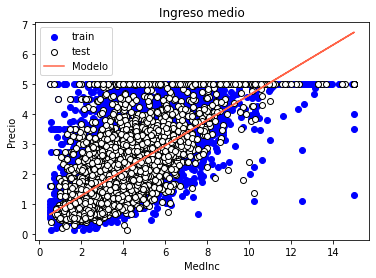

In [16]:
# Paso 4: Graficar el modelo y los puntos de entrenamiento y evaluación
import matplotlib.pyplot as plt
plt.scatter(X_train, y_train, color='blue', label='train')
plt.scatter(X_test, y_test, color='white',edgecolor="k", label='test')
plt.plot(X, reg.predict(X), color='tomato', label='Modelo')
plt.xlabel('MedInc')
plt.ylabel('Precio')
plt.title("Ingreso medio")
plt.legend()
plt.show()

Paso 5:

El modelo de regresión lineal muestra un error cuadrático medio (MSE) de 0.69 en el conjunto de entrenamiento y 0.72 en el conjunto de evaluación. Esto indica que el modelo no tiene un buen ajuste a los datos tanto en el conjunto de entrenamiento como en el de evaluación.

En la gráfica, se observa que la línea de regresión sigue la tendencia de los datos. Esto sugiere que el modelo es capaz de capturar la relación general entre la variable predictora (MedInc) y la variable objetivo (Precio). La tendencia ascendente de la línea de regresión indica que a medida que aumenta el ingreso medio en el grupo de bloques, se tiende a observar precios más altos de las viviendas.

En resumen, el modelo de regresión lineal con la variable predictora MedInc no parece ser una buena elección para predecir los precios de las viviendas. Pero tiene concordancia entre la línea de regresión y los datos sugieren un buen ajuste del modelo a los datos disponibles.

## Ejercicio 4: Regresión Polinomial

En este ejercicio deben entrenar regresiones polinomiales de diferente complejidad, siempre usando **scikit-learn**.

Deben usar **el mismo atributo** seleccionado para el ejercicio anterior.

1. Para varios grados de polinomio, haga lo siguiente:
    1. Instancie y entrene una regresión polinomial.
    2. Prediga y calcule error en entrenamiento y evaluación. Imprima los valores.
    3. Guarde los errores en una lista.
2. Grafique las curvas de error en términos del grado del polinomio.
3. Interprete la curva, identificando el punto en que comienza a haber sobreajuste, si lo hay.
4. Seleccione el modelo que mejor funcione, y grafique el modelo conjuntamente con los puntos.
5. Interprete el resultado, haciendo algún comentario sobre las cualidades del modelo obtenido.

**Observación:** Con algunos atributos se pueden obtener errores en test menores a 40 e incluso a 35.

In [ ]:
# 1. Resolver acá.

In [ ]:
# 2. Graficar curvas de error acá.

In [ ]:
# 4. Reconstruir mejor modelo acá y graficar.

## Ejercicio 5: Regresión con más de un Atributo

En este ejercicio deben entrenar regresiones que toman más de un atributo de entrada.

1. Seleccione **dos o tres atributos** entre los más relevantes encontrados en el ejercicio 2.
2. Repita el ejercicio anterior, pero usando los atributos seleccionados. No hace falta graficar el modelo final.
3. Interprete el resultado y compare con los ejercicios anteriores. ¿Se obtuvieron mejores modelos? ¿Porqué?

In [127]:
# 1. Resolver acá. Ayuda (con dos atributos):
selector = (np.array(california['feature_names']) == 'HouseAge') | (np.array(california['feature_names']) == 'AveRooms')

X_train_fs = X_train[:, selector]
X_test_fs = X_test[:, selector]
X_train_fs.shape, X_test_fs.shape

((16512, 2), (4128, 2))

In [ ]:
# 2. Resolver acá.

## Más ejercicios (opcionales)

### Ejercicio 6: A Todo Feature

Entrene y evalúe regresiones pero utilizando todos los atributos de entrada (va a andar mucho más lento). Estudie los resultados.

### Ejercicio 7: Regularización

Entrene y evalúe regresiones con regularización "ridge". Deberá probar distintos valores de "alpha" (fuerza de la regularización). ¿Mejoran los resultados?
